See if we can somehow get CIVdist for subsamples of quasars to corelate with luminosity, or if we can find some kind of correction to beat down the scatter.  Really we can use anything from the SDSS catalog -- just **NO X-ray data!**  Although it might be useful to find things that correlate with useful x-ray props and reverse-engineer that to a point where x-ray is no longer needed (in another notebook).

I'm just going to keep this simple: remove dust-reddened objects, and colorcode by basically everything to see what we're working with.

In [1]:
#import necessary packages
from astropy.table import Table
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import norm
from astropy.stats import sigma_clip
import matplotlib.mlab as mlab
import sys
sys.path.append("/Users/Trevor1/Desktop/git/CIV_Distance/") #wherever CIV distance repo is saved
#sys.path.append("/Users/trevormccaffrey/Desktop/git/CIV_Distance/")
from CIVfunctions import project,CIV_distance

#Default MPL colorcycle
mplcol = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [3]:
dat = pd.read_csv("/Users/Trevor1/Desktop/data/files/catalogs/Rankine20_CIV_HeII_wDelGI_wCIVDist.csv")
print("Original Data: %d objects" % dat.shape[0])
dat.head()

Original Data: 145946 objects


,Unnamed: 0,SDSS_NAME,RA,Dec,z_paul,good,nBAL,AIi,BIi,CIV_blue,...,LUM_0.2_12.0keV,FUV,FUV_IVAR,NUV,NUV_IVAR,FIRST_FLUX,FIRST_SNR,Delta_G_I,Separation,CIV_Distance
0,0,b'003708.46+002855.8',9.285266,0.482174,3.02295,True,False,False,True,691.966469,...,NaN,0.032006,45.552314,-0.018692,3.531072,-1.0,-1.0,0.600,0.000000e+00,0.373444
1,1,b'004959.24+001903.1',12.496858,0.317540,3.32150,True,False,False,True,857.180965,...,NaN,-0.079175,12.024832,-0.040529,3.323599,-1.0,-1.0,0.375,1.144982e-11,0.618225
2,2,b'015017.70+002902.4',27.573786,0.484025,3.00333,True,False,False,True,1474.865400,...,NaN,-0.068240,1074.827534,0.183702,373.859257,-1.0,-1.0,0.167,2.289918e-11,0.681618
3,3,b'023238.49-001936.2',38.160390,-0.326749,3.34348,True,False,False,True,715.316626,...,NaN,-0.042674,229.386872,0.313899,1.875008,-1.0,-1.0,0.831,0.000000e+00,0.563721
4,4,b'072047.82+405455.5',110.199280,40.915418,3.04179,True,False,False,True,195.093283,...,NaN,-0.394990,7.126986,0.070899,32.722264,-1.0,-1.0,-0.159,0.000000e+00,0.282193


First just visualize the impact each successive cut has

* Remove dust-reddened objects: $\Delta(g-i) < 0.3$ (maybe should be absolute value?)
* Remove RL sources -- safe to consider all FIRST detections as RL (or at least very close to being RL).  In fact we might want to be more robust in removing RL sources at high-$z$ that remain undetected by FIRST.

In [7]:
good   = dat["good"].values
Mi     = dat["MI"].values
del_gi = dat["Delta_G_I"].values
clean  = good & ((Mi<0)&(Mi>-32)) & ((del_gi>-0.3)&(del_gi<0.3))
clean2 = good & ((Mi<0)&(Mi>-32))
d      = 3.08e19 #cm; =10pc
L2500  = -0.4*( Mi + 48.60 + np.log10(1+2) ) + np.log10(4*np.pi*(d**2)) #Eq 4 from Richards+ 2006, QLF paper

blue   = dat["CIV_blue"].values
ew     = dat["CIV_EW"].values
z      = dat["z_paul"].values
logEW  = np.log10(ew)
HeIIEW = dat["HeII_EW"].values
CIVdist= dat["CIV_Distance"].values
first  = dat["FIRST_FLUX"].values!=-1.0

<ipython-input-7-7579dbd07038>:12: RuntimeWarning: divide by zero encountered in log10
  logEW  = np.log10(ew)
<ipython-input-7-7579dbd07038>:12: RuntimeWarning: invalid value encountered in log10
  logEW  = np.log10(ew)


In [5]:
dat.columns

Index(['Unnamed: 0', 'SDSS_NAME', 'RA', 'Dec', 'z_paul', 'good', 'nBAL', 'AIi',
       'BIi', 'CIV_blue', 'CIV_EW', 'HeII_EW', 'THING_ID', 'PLATE', 'MJD',
       'FIBERID', 'SPECTRO', 'Z', 'Z_ERR', 'SOURCE_Z', 'Z_VI', 'Z_PIPE',
       'Z_PIPE_ERR', 'ZWARNING', 'Z_PCA', 'Z_PCA_ER', 'Z_MGII', 'BOSS_TARGET1',
       'ANCILLARY_TARGET1', 'ANCILLARY_TARGET2', 'EBOSS_TARGET0',
       'EBOSS_TARGET1', 'EBOSS_TARGET2', 'N_SPEC_SDSS', 'N_SPEC_BOSS',
       'N_SPEC', 'BI_CIV', 'ERR_BI_CIV', 'RUN_NUMBER', 'RERUN_NUMBER',
       'COL_NUMBER', 'FIELD_NUMBER', 'OBJ_ID', 'MI', 'RASS_COUNTS',
       'RASS_COUNTS_SNR', 'SDSS2ROSAT_SEP', 'FLUX_0.2_2.0keV',
       'FLUX_0.2_2.0keV_ERR', 'FLUX_2.0_12.0keV', 'FLUX_2.0_12.0keV_ERR',
       'FLUX_0.2_12.0keV', 'FLUX_0.2_12.0keV_ERR', 'LUM_0.2_12.0keV', 'FUV',
       'FUV_IVAR', 'NUV', 'NUV_IVAR', 'FIRST_FLUX', 'FIRST_SNR', 'Delta_G_I',
       'Separation', 'CIV_Distance'],
      dtype='object')

In [6]:
dat["FIRST_FLUX"]

0        -1.0
1        -1.0
2        -1.0
3        -1.0
4        -1.0
         ... 
145941   -1.0
145942   -1.0
145943   -1.0
145944   -1.0
145945   -1.0
Name: FIRST_FLUX, Length: 145946, dtype: float64

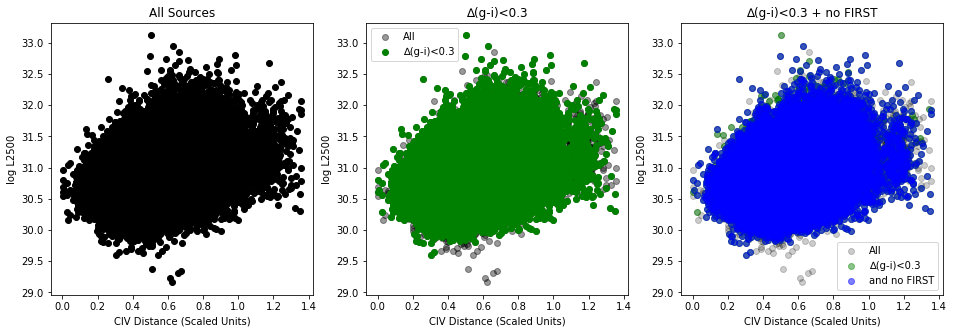

Number of Sources
All:                   140934
∆(g-i)<0.3:            121692
∆(g-i)<0.3 + no FIRST: 118259


In [26]:
fig, [ax1,ax2,ax3] = plt.subplots(1, 3, figsize=(16,5))

#Plot all objects
ax1.scatter(CIVdist[clean2], L2500[clean2], color="k")
ax1.set_xlabel("CIV Distance (Scaled Units)")
ax1.set_ylabel("log L2500")
ax1.set_title("All Sources")

#Remove dust-reddened sources
ax2.scatter(CIVdist[clean2], L2500[clean2], alpha=0.4, color="k", label="All")
ax2.scatter(CIVdist[clean], L2500[clean], color="g", label="∆(g-i)<0.3")
ax2.set_xlabel("CIV Distance (Scaled Units)")
ax2.set_ylabel("log L2500")
ax2.set_title("∆(g-i)<0.3")
ax2.legend(loc="best")

ax3.scatter(CIVdist[clean2], L2500[clean2], alpha=0.2, color="k", label="All")
ax3.scatter(CIVdist[clean], L2500[clean], alpha=0.45, color="g", label="∆(g-i)<0.3")
ax3.scatter(CIVdist[clean&~first], L2500[clean&~first], alpha=0.5, color="b", label="and no FIRST")
ax3.set_xlabel("CIV Distance (Scaled Units)")
ax3.set_ylabel("log L2500")
ax3.set_title("∆(g-i)<0.3 + no FIRST")
ax3.legend(loc="best")
plt.show()

print("Number of Sources")
print("All:                   %5d" % clean2.sum())
print("∆(g-i)<0.3:            %5d" % clean.sum())
print("∆(g-i)<0.3 + no FIRST: %5d" % (clean&~first).sum())

Cuts definitely make an impact.  Hard to see the full impact from these, but note that there are some clear Malmquist bias in the distribution, i.e., the fraction of low-luminosity sources is inflated by the more sources at lower redshift (see redshift plots below).

In [27]:
#Only keep measurements Amy R counts as "good" - and define our full "clean" sample
dat    = dat[clean&(~first)]

Mi     = dat["MI"].values
d      = 3.08e19 #cm; =10pc
L2500  = -0.4*( Mi + 48.60 + np.log10(1+2) ) + np.log10(4*np.pi*(d**2)) #Eq 4 from Richards+ 2006, QLF paper
del_gi = dat["Delta_G_I"].values
blue   = dat["CIV_blue"].values
ew     = dat["CIV_EW"].values
z      = dat["z_paul"].values
logEW  = np.log10(ew)
HeIIEW = dat["HeII_EW"].values
CIVdist= dat["CIV_Distance"].values

print("'Clean' Data: %d objects" % dat.shape[0])
dat.head()

'Clean' Data: 118259 objects


,Unnamed: 0,SDSS_NAME,RA,Dec,z_paul,good,nBAL,AIi,BIi,CIV_blue,...,LUM_0.2_12.0keV,FUV,FUV_IVAR,NUV,NUV_IVAR,FIRST_FLUX,FIRST_SNR,Delta_G_I,Separation,CIV_Distance
2,2,b'015017.70+002902.4',27.573786,0.484025,3.00333,True,False,False,True,1474.865400,...,NaN,-0.068240,1074.827534,0.183702,373.859257,-1.0,-1.0,0.167,2.289918e-11,0.681618
4,4,b'072047.82+405455.5',110.199280,40.915418,3.04179,True,False,False,True,195.093283,...,NaN,-0.394990,7.126986,0.070899,32.722264,-1.0,-1.0,-0.159,0.000000e+00,0.282193
5,5,b'073232.79+435500.4',113.136665,43.916780,3.46127,True,False,False,True,1705.584779,...,NaN,-0.018190,13.799765,0.045068,14.035241,-1.0,-1.0,-0.022,3.299193e-11,0.698071
6,6,b'073346.60+465836.2',113.444183,46.976735,2.19711,True,False,False,True,820.113836,...,NaN,0.347028,4.586199,-0.047932,217.287807,-1.0,-1.0,0.291,4.579999e-11,0.552542
8,8,b'074717.69+483917.4',116.823739,48.654850,1.88349,True,False,False,True,1255.186285,...,NaN,0.091723,20.541693,0.221892,269.526076,-1.0,-1.0,0.057,2.289999e-11,0.634468


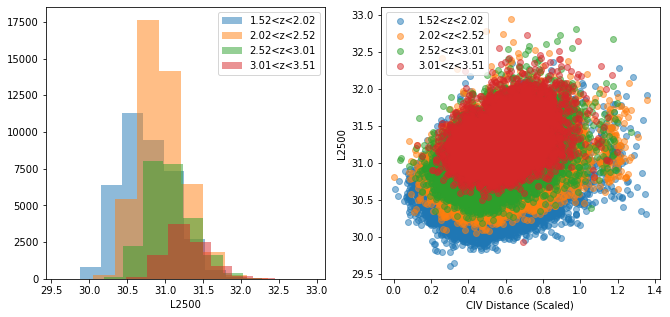

In [31]:
zbins = np.linspace(z.min(), z.max()+.01, 5)
fig, [ax1,ax2] = plt.subplots(1, 2, figsize=(11,5))
for i in range(len(zbins)-1):
    binmask = (z>=zbins[i])&(z<zbins[i+1])
    ax1.hist(L2500[binmask], alpha=0.5, label="%.2f<z<%.2f" % (zbins[i],zbins[i+1]))
    ax1.set_xlabel("L2500") ; ax1.legend(loc="best")
    ax2.scatter(CIVdist[binmask], L2500[binmask], alpha=0.5, label="%.2f<z<%.2f" % (zbins[i],zbins[i+1]))
    ax2.set_xlabel("CIV Distance (Scaled)") ; ax2.set_ylabel("L2500") ; ax2.legend(loc="best")

Text(0, 0.5, 'L2500')

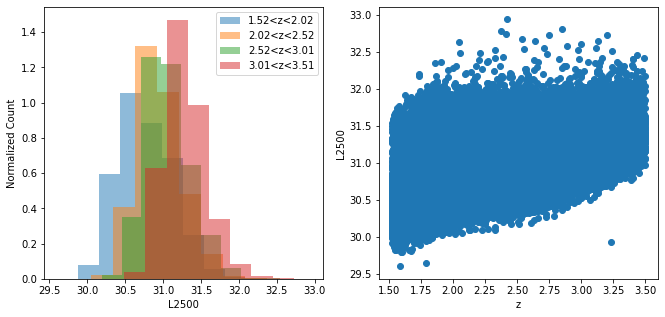

In [35]:
fig, [ax1,ax2] = plt.subplots(1, 2, figsize=(11,5))
for i in range(len(zbins)-1):
    binmask = (z>=zbins[i])&(z<zbins[i+1])
    ax1.hist(L2500[binmask], alpha=0.5, label="%.2f<z<%.2f" % (zbins[i],zbins[i+1]), density=True)
    ax1.set_xlabel("L2500") ; ax1.set_ylabel("Normalized Count"); ax1.legend(loc="best")
ax2.scatter(z, L2500)
ax2.set_xlabel("z") ; ax2.set_ylabel("L2500")

We're going to need to deal with this at some point.  I don't think just shifting the median L2500 in redshift bins is the right thing to do, because this looks at least partially to be a selection effect?  Now it just looks like we could remove sources near the SDSS flux limit.

For now I'll just ignore it and see how things go.

---

We kind of just need to find something to beat down this scatter.  I'll first just brute force it and colorcode CIV plots by basically everything.  Maybe clustering $ugriz$ colors could be somehow useful?

In [36]:
plt.colorbar?

In [63]:
%matplotlib inline
def plot(x, y, c, xname="", yname="", cname=""):
    fig = plt.figure(figsize=(7,6))
    plt.scatter(x, y, alpha=0.7, c=c, cmap="nipy_spectral")#, vmin=np.percentile(c, 5), vmax=np.percentile(c, 95))
    cbar = plt.colorbar()
    cbar.ax.set_ylabel(cname)
    plt.xlabel(xname)
    plt.ylabel(yname)
    #plt.show()
    
def plot_CIV(colorprop, colorname):
    fig, [ax1,ax2,ax3,cax] = plt.subplots(1, 4, figsize=(17.5,5), gridspec_kw={"width_ratios":[1,1,1,0.03]})
    
    p1 = ax1.scatter(CIVdist, L2500, c=colorprop, vmin=np.percentile(colorprop, 2), vmax=np.percentile(colorprop, 98))
    ax1.set_xlabel("CIV Distance") ; ax1.set_ylabel("L2500")
    
    ax2.scatter(logEW, L2500, c=colorprop, vmin=np.percentile(colorprop, 2), vmax=np.percentile(colorprop, 98))
    ax2.set_xlabel("log EW") ; ax2.set_ylabel("L2500")
    
    ax3.scatter(blue, L2500, c=colorprop, vmin=np.percentile(colorprop, 2), vmax=np.percentile(colorprop, 98))
    ax3.set_xlabel("Blueshift") ; ax3.set_ylabel("L2500")
    
    cbar = fig.colorbar(p1, cax=cax)
    cbar.ax.set_ylabel(colorname)
    
    plt.show()

#plot(CIVdist[z<2.9], L2500[z<2.9], z[z<2.9], "CIV distance", "L2500", "z")

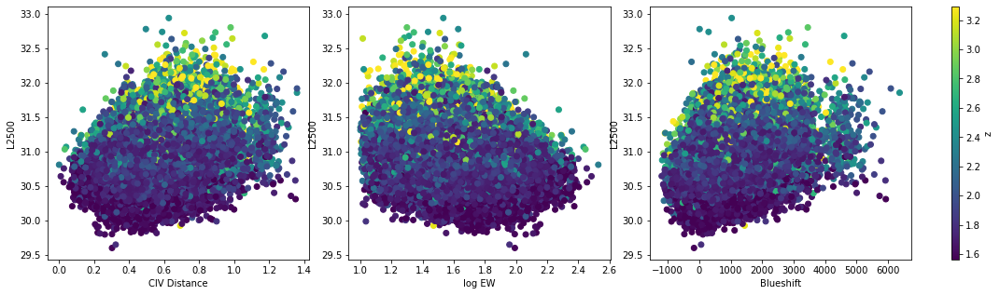

In [64]:
plot_CIV(z, "z")

In [58]:
dat.columns

Index(['Unnamed: 0', 'SDSS_NAME', 'RA', 'Dec', 'z_paul', 'good', 'nBAL', 'AIi',
       'BIi', 'CIV_blue', 'CIV_EW', 'HeII_EW', 'THING_ID', 'PLATE', 'MJD',
       'FIBERID', 'SPECTRO', 'Z', 'Z_ERR', 'SOURCE_Z', 'Z_VI', 'Z_PIPE',
       'Z_PIPE_ERR', 'ZWARNING', 'Z_PCA', 'Z_PCA_ER', 'Z_MGII', 'BOSS_TARGET1',
       'ANCILLARY_TARGET1', 'ANCILLARY_TARGET2', 'EBOSS_TARGET0',
       'EBOSS_TARGET1', 'EBOSS_TARGET2', 'N_SPEC_SDSS', 'N_SPEC_BOSS',
       'N_SPEC', 'BI_CIV', 'ERR_BI_CIV', 'RUN_NUMBER', 'RERUN_NUMBER',
       'COL_NUMBER', 'FIELD_NUMBER', 'OBJ_ID', 'MI', 'RASS_COUNTS',
       'RASS_COUNTS_SNR', 'SDSS2ROSAT_SEP', 'FLUX_0.2_2.0keV',
       'FLUX_0.2_2.0keV_ERR', 'FLUX_2.0_12.0keV', 'FLUX_2.0_12.0keV_ERR',
       'FLUX_0.2_12.0keV', 'FLUX_0.2_12.0keV_ERR', 'LUM_0.2_12.0keV', 'FUV',
       'FUV_IVAR', 'NUV', 'NUV_IVAR', 'FIRST_FLUX', 'FIRST_SNR', 'Delta_G_I',
       'Separation', 'CIV_Distance'],
      dtype='object')

In [72]:
dat.iloc[:,i]

2         0.681618
4         0.282193
5         0.698071
6         0.552542
8         0.634468
            ...   
145941    0.541151
145942    0.271323
145943    0.421787
145944    0.778887
145945    0.943038
Name: CIV_Distance, Length: 118259, dtype: float64

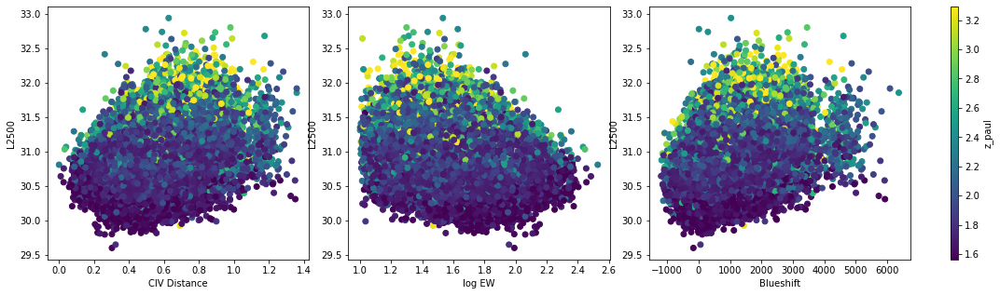

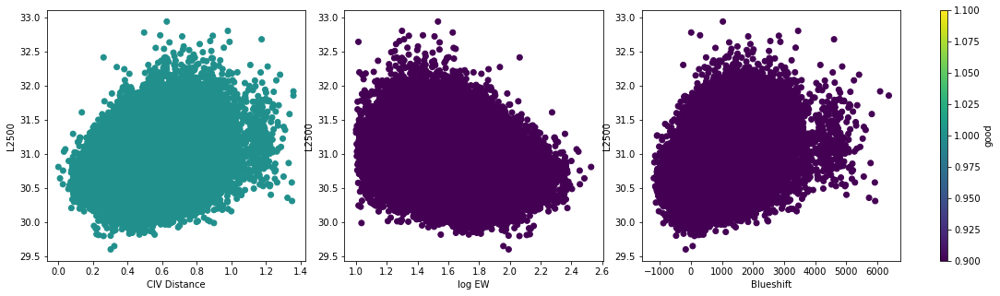

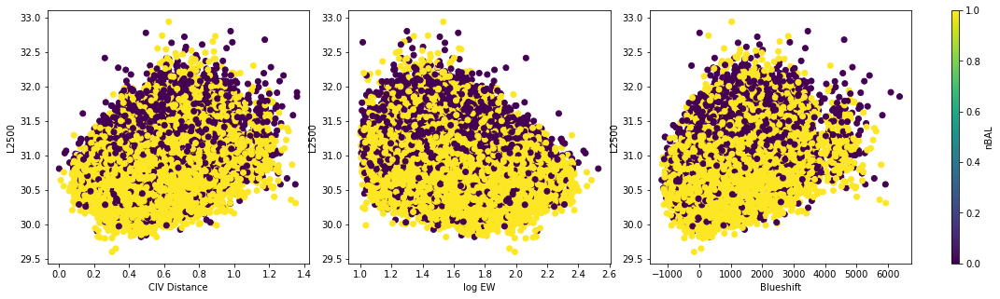

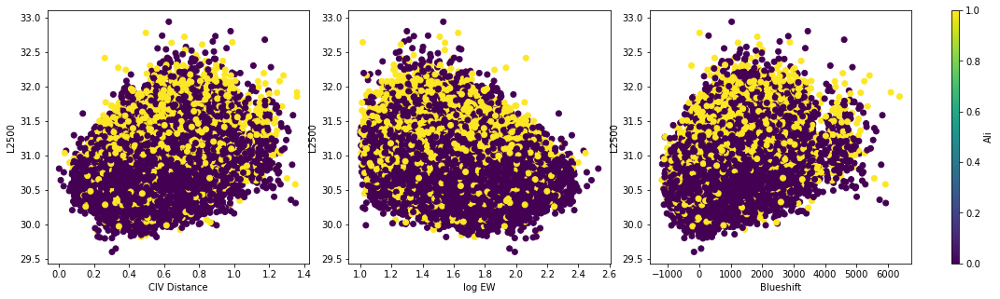

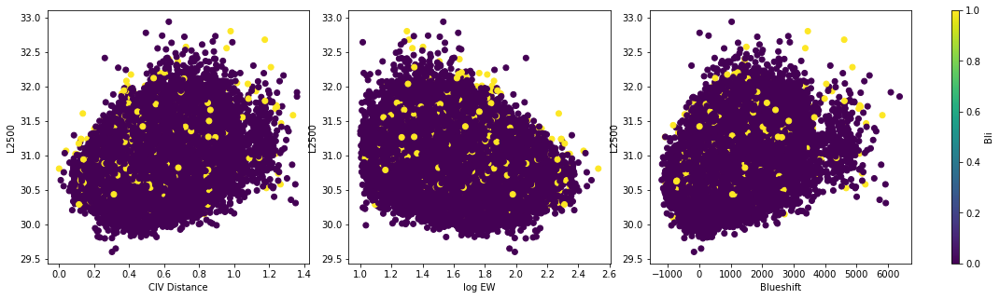

...

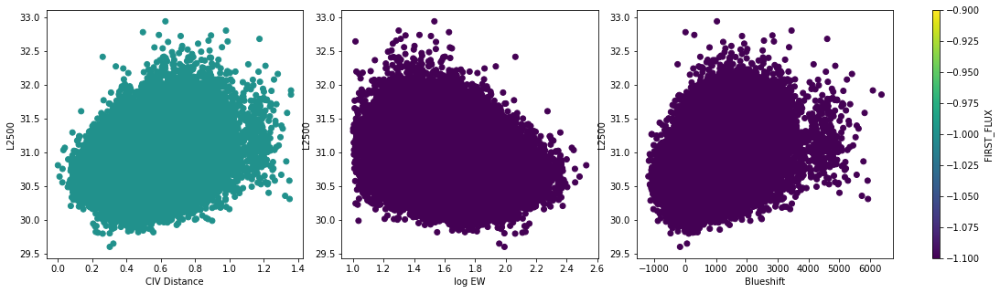

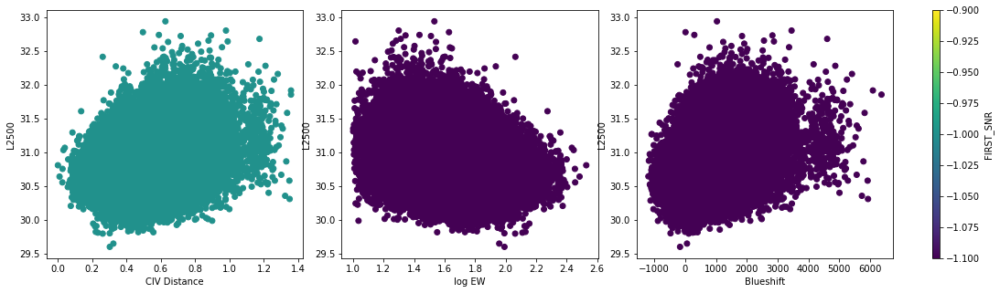

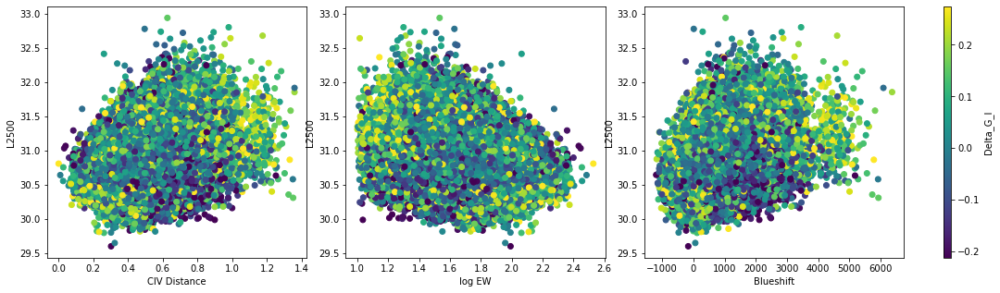

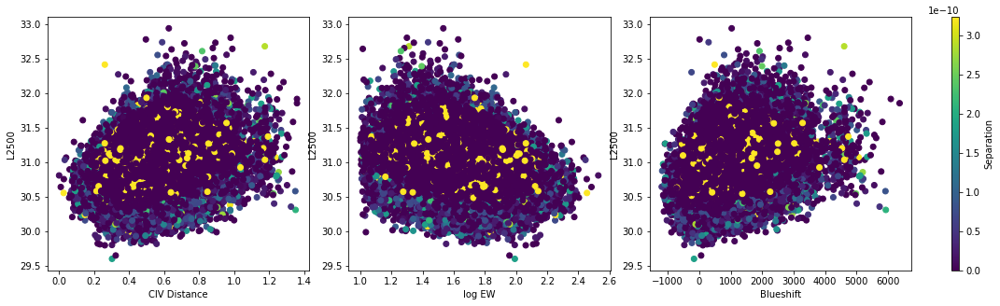

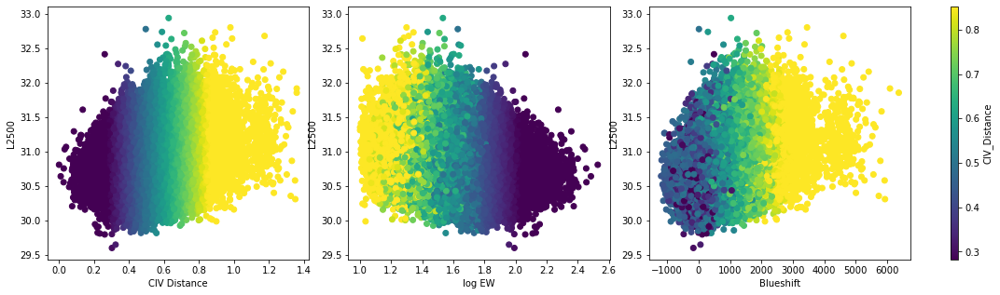

In [73]:
for i in range(4, len(dat.columns)):
    try:
        plot_CIV(dat.iloc[:,i], dat.columns[i])
    except TypeError:
        plt.show()
        continue